In [1]:
# pip install numpy matplotlib scipy imageio pillow rawpy opencv-contrib-python

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import convolve2d
import imageio
from PIL import Image
import matplotlib.pyplot as plt
import rawpy


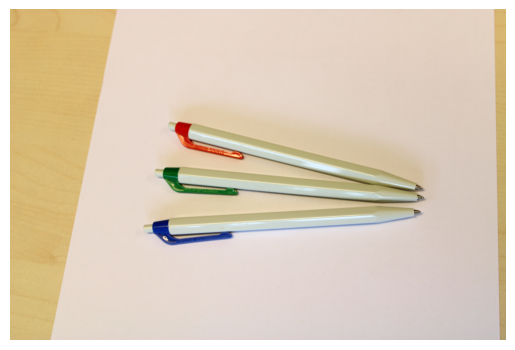

In [3]:
img = Image.open('exercise_2_data/01/IMG_9939.JPG')

plt.imshow(img)
plt.axis("off")  # hide axes
plt.show()

In [4]:
array = np.load('exercise_2_data/01/IMG_9939.npy')
print('Loaded array of size', array.shape)
print('The pens, from top to bottom, are red, green and blue')

Loaded array of size (4014, 6020)
The pens, from top to bottom, are red, green and blue


- Display basic information and a small section of the array to inspect the pattern

In [5]:
print("Dtype:", array.dtype)
print("Min / Max:", array.min(), "/", array.max())
array[:10, :10]

Dtype: uint16
Min / Max: 2095 / 8385


array([[3361, 2596, 3352, 2614, 3389, 2603, 3419, 2615, 3355, 2602],
       [2829, 3371, 2854, 3405, 2815, 3378, 2864, 3381, 2848, 3418],
       [3382, 2614, 3380, 2608, 3389, 2598, 3414, 2604, 3413, 2564],
       [2833, 3370, 2894, 3374, 2844, 3347, 2869, 3403, 2845, 3389],
       [3416, 2590, 3406, 2598, 3402, 2606, 3437, 2611, 3379, 2632],
       [2836, 3327, 2837, 3415, 2822, 3370, 2858, 3441, 2808, 3362],
       [3370, 2593, 3411, 2611, 3414, 2599, 3364, 2591, 3387, 2618],
       [2876, 3414, 2865, 3424, 2856, 3413, 2880, 3380, 2804, 3389],
       [3374, 2605, 3342, 2614, 3394, 2589, 3406, 2598, 3376, 2620],
       [2863, 3371, 2901, 3395, 2833, 3427, 2833, 3384, 2889, 3392]],
      dtype=uint16)

The data above alternates between higher and lower values across both rows and columns.


Visualizing the first 10x10 block of the sensor data to interpret the pattern

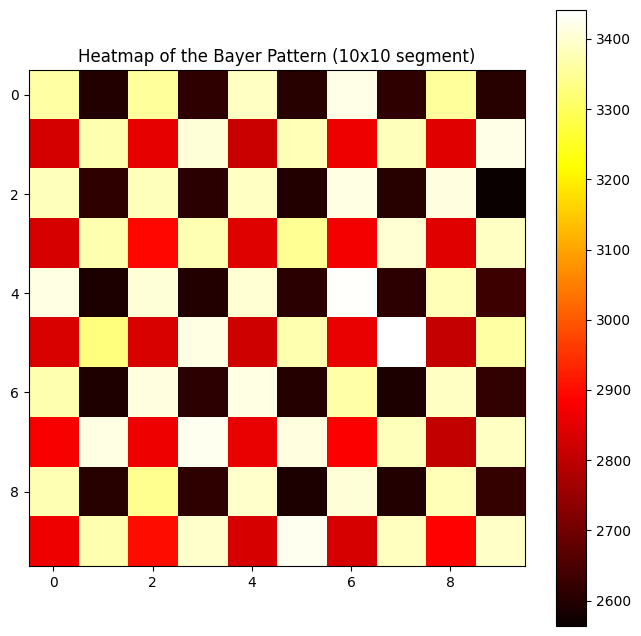

In [6]:
# plt.figure(figsize=(6, 6))
# plt.imshow(array, cmap="gray")
# plt.title("IMG_9939 raw Bayer mosaic")
# plt.axis("off")
# plt.colorbar(label="Raw value")
# plt.show()
plt.figure(figsize=(8, 8))
plt.imshow(array[:10, :10], cmap='hot', interpolation='nearest')
plt.colorbar()
plt.title('Heatmap of the Bayer Pattern (10x10 segment)')
plt.show()

## 1. Analysis of Bayern Pattern

Function to display the max, min, and mean values in a small window to help identify the pattern

In [7]:
def analyze_bayer_segment(data, window_size=4):
    # Ensure the window size does not exceed data dimensions
    window_size = min(window_size, data.shape[0], data.shape[1])
    
    # Extract the window from the data
    window = data[:window_size, :window_size]
    
    # Calculate max, min, and mean values
    max_values = np.max(window, axis=0)
    min_values = np.min(window, axis=0)
    mean_values = np.mean(window, axis=0)
    
    # Print the results
    print("Max values per column in the window:")
    print(max_values)
    print("Min values per column in the window:")
    print(min_values)
    print("Mean values per column in the window:")
    print(mean_values)
    
    # Visualize the window with a heatmap
    plt.figure(figsize=(5, 5))
    plt.imshow(window, cmap='hot', interpolation='nearest')
    plt.colorbar()
    plt.title(f'Heatmap of the Bayer Pattern ({window_size}x{window_size} segment)')
    plt.show()

Max values per column in the window:
[3382 3371 3380 3405]
Min values per column in the window:
[2829 2596 2854 2608]
Mean values per column in the window:
[3101.25 2987.75 3120.   3000.25]


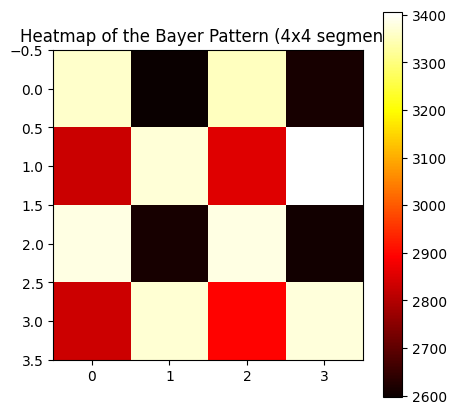

In [8]:
analyze_bayer_segment(array, window_size=4)

To confirm whether it's RGGB or BGGR, we would look for a consistency in the distribution across several blocks to determine if red or blue typically appears in the top-left of these segments

**Function to extract multiple 4x4 segments from different parts of the image**

In [9]:
def multiple_segment_analysis(data, num_samples=5):
    segments = []
    np.random.seed(42)  # For reproducibility

    # Ensuring the random segments do not exceed the boundaries of the data
    max_row = data.shape[0] - 4
    max_col = data.shape[1] - 4

    for _ in range(num_samples):
        start_row = np.random.randint(0, max_row)
        start_col = np.random.randint(0, max_col)
        segment = data[start_row:start_row+4, start_col:start_col+4]
        segments.append(segment)

    return segments

In [10]:
random_segments = multiple_segment_analysis(array, num_samples=5)

- Analyze each of the extracted segments

Analysis of Segment 1:
Max values per column in the window:
[4642 4696 4715 4719]
Min values per column in the window:
[3304 3486 3380 3523]
Mean values per column in the window:
[3985.   4100.25 4037.   4100.5 ]


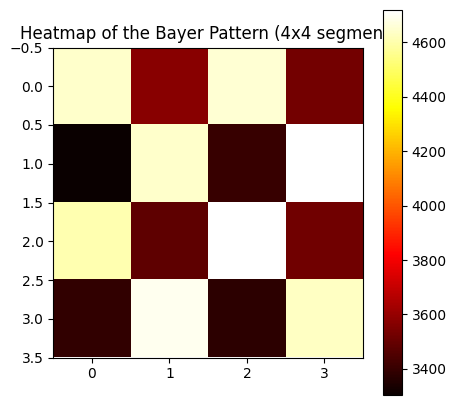

Analysis of Segment 2:
Max values per column in the window:
[4412 4443 4370 4417]
Min values per column in the window:
[3236 3337 3221 3294]
Mean values per column in the window:
[3815.   3865.25 3790.25 3850.  ]


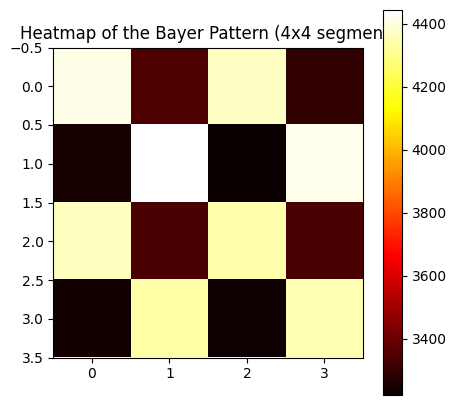

Analysis of Segment 3:
Max values per column in the window:
[4978 4951 4981 5059]
Min values per column in the window:
[3530 3655 3475 3657]
Mean values per column in the window:
[4251.5  4310.75 4239.75 4350.25]


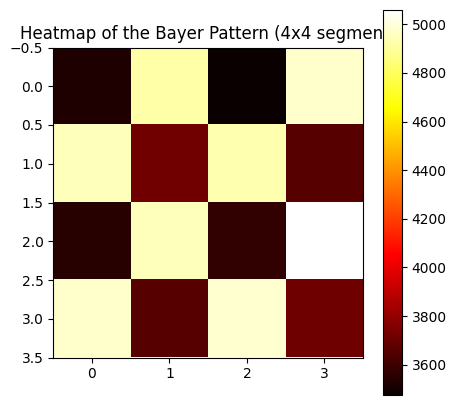

Analysis of Segment 4:
Max values per column in the window:
[4004 3991 4019 4012]
Min values per column in the window:
[3003 3147 3011 3185]
Mean values per column in the window:
[3505.   3585.   3519.25 3602.75]


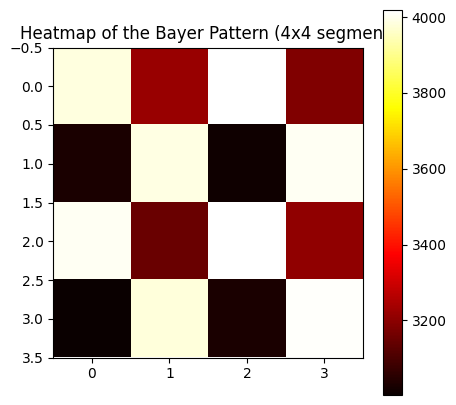

Analysis of Segment 5:
Max values per column in the window:
[3909 3844 3839 3889]
Min values per column in the window:
[3054 2784 3082 2785]
Mean values per column in the window:
[3489.   3314.75 3468.25 3326.5 ]


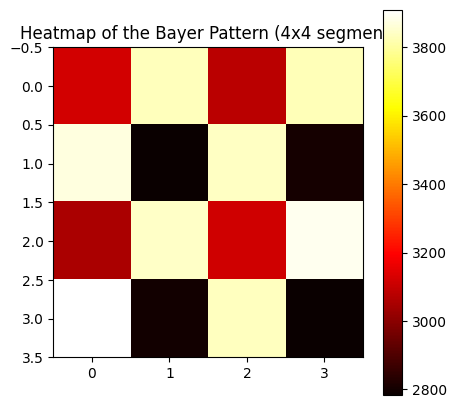

In [11]:
for i, segment in enumerate(random_segments, start=1):
    print(f"Analysis of Segment {i}:")
    analyze_bayer_segment(segment)

The consistency of the high-value columns across different image segments strongly suggests a standard Bayer pattern configuration with a predominant placement of green pixels. Given the typical Bayer patterns (RGGB, BGGR, GBRG, GRBG) and the consistent higher values in diagonally positioned pixels in each 2x2 subarray of the segments, this data aligns closely with either RGGB or BGGR

# 2. implement Demosaicing Algorithem

Steps to Implement Demosaicing:

- Load the Raw Image Data: Here the reading of the raw pixel values from the CR3 file will be done which requires a library rawpy.

- Create Masks for Each Color Channel: Create binary masks that select pixels corresponding to each color—red, green, and blue.

- Define the Convolution Kernel: A simple average or more complex kernels can be used to interpolate missing color information at each pixel.

- Apply Convolution: Convolve the masked image data with the kernel to interpolate missing values within each channel.

- Normalize: After convolution, normalize the results by dividing by the sum of the kernel applied over the valid mask areas to get a weighted average.

- Construct the Full Color Image: Combine the independently processed color channels into a single RGB image.

- Conversion for Viewing: Convert the high dynamic range values to a standard 8-bit format for viewing, but only after all processing steps are completed.

In [12]:
# Defining Demosaicing Function
def simple_demosaicing(raw_data):
    # Assume RGGB Bayer pattern
    mask_R = np.zeros_like(raw_data)
    mask_R[0::2, 0::2] = 1  # Red pixels
    mask_G = np.zeros_like(raw_data)
    mask_G[0::2, 1::2] = 1  # Green pixels on red rows
    mask_G[1::2, 0::2] = 1  # Green pixels on blue rows
    mask_B = np.zeros_like(raw_data)
    mask_B[1::2, 1::2] = 1  # Blue pixels

    # Convolution kernel
    kernel = np.ones((3, 3)) / 9

    # Apply the masks and convolve
    R = convolve2d(raw_data * mask_R, kernel, mode='same', boundary='symm') / convolve2d(mask_R, kernel, mode='same', boundary='symm')
    G = convolve2d(raw_data * mask_G, kernel, mode='same', boundary='symm') / convolve2d(mask_G, kernel, mode='same', boundary='symm')
    B = convolve2d(raw_data * mask_B, kernel, mode='same', boundary='symm') / convolve2d(mask_B, kernel, mode='same', boundary='symm')

    # Stack the channels to form an RGB image
    return np.stack((R, G, B), axis=-1)

In [13]:
# Defining The Percentile Normalization Function
def percentile_normalization(img):
    a = np.percentile(img, 0.01)
    b = np.percentile(img, 99.99)
    img = (img - a) / (b - a)
    img[img < 0] = 0
    img[img > 1] = 1
    return img

Load Raw image

In [14]:
with rawpy.imread('exercise_2_data/02/IMG_4782.CR3') as raw:
    raw_array = raw.raw_image_visible.copy()

In [15]:
rgb_image = simple_demosaicing(raw_array)


In [16]:
rgb_image_normalized = percentile_normalization(rgb_image)

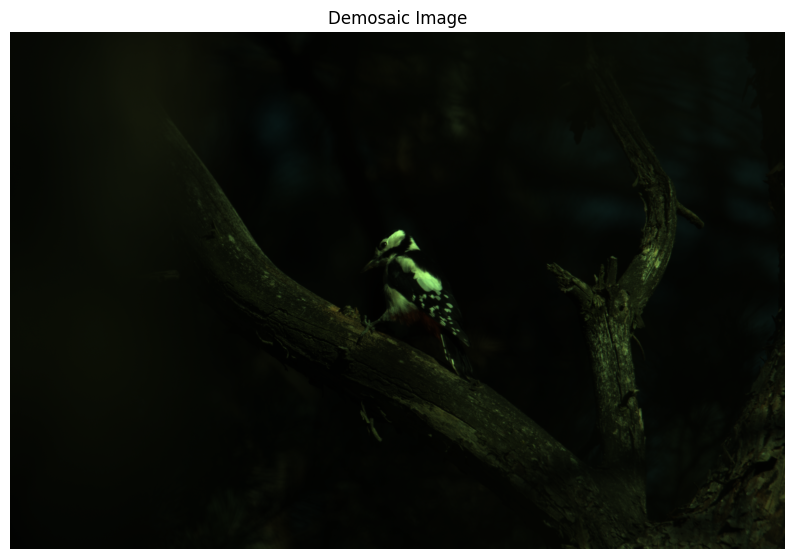

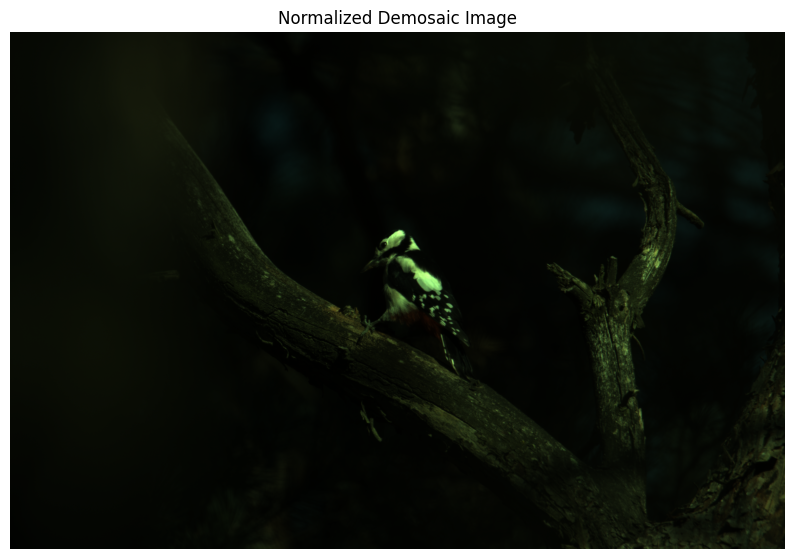

In [17]:
# visualization
def visualize_image(rgb_image,title):
    # Dynamically scale the image data
    img_min = np.min(rgb_image)
    img_max = np.max(rgb_image)
    scaled_image = (rgb_image - img_min) / (img_max - img_min)
    plt.figure(figsize=(10, 10))
    plt.imshow(scaled_image)
    plt.title(title)
    plt.axis('off')
    plt.show()

def save_image(rgb_image, filename):
    img_min = np.min(rgb_image)
    img_max = np.max(rgb_image)
    scaled_image = (rgb_image - img_min) / (img_max - img_min)
    
    # Convert to 8-bit for saving
    image_8bit = (255 * scaled_image).astype(np.uint8)
    imageio.imwrite(filename, image_8bit)

# Visualize the demosaicing image
visualize_image(rgb_image, "Demosaic Image")
# Save the demosaicing image to file
save_image(rgb_image, 'Demosaicing image.jpg')

# Visualize the normalized image
visualize_image(rgb_image_normalized, "Normalized Demosaic Image")
# Save the normalized image to file
save_image(rgb_image_normalized, 'Normalized Demosaicing image.jpg')

# 3. Improve the Luminosity

In [64]:
def normalize_with_percentiles(image, low=0.01, high=99.99):
    """Normalize image to [0,1] using percentiles instead of min/max."""
    a = np.percentile(image, low)
    b = np.percentile(image, high)
    img_norm = (image - a) / (b - a)
    img_norm = np.clip(img_norm, 0, 1)
    return img_norm, a, b


In [65]:
def apply_gamma_correction(image, gamma=0.3, low=0.01, high=99.99):
    """Gamma curve y = x^gamma with percentile-based normalization."""
    img_norm, a, b = normalize_with_percentiles(image, low, high)

    # gamma correction in [0,1]
    img_gamma_norm = np.power(img_norm, gamma)

    # invert normalization back to original value range
    img_gamma = img_gamma_norm * (b - a) + a
    return img_gamma

In [66]:
def apply_logarithmic_transformation(image, low=0.01, high=99.99):
    """Logarithmic curve as an alternative to gamma."""
    img_norm, a, b = normalize_with_percentiles(image, low, high)

    # log curve in [0,1]; log1p(0)=0, log1p(1)=log(2)
    log_norm = np.log1p(img_norm) / np.log(2.0)

    # invert normalization back to original value range
    log_img = log_norm * (b - a) + a
    return log_img

In [67]:
# Use your demosaiced RGB image here (replace `rgb_image` with your variable name if different)
gamma_corrected_image = apply_gamma_correction(rgb_image, gamma=0.3)


In [68]:
log_transformed_image = apply_logarithmic_transformation(rgb_image)

description

**Visualization**

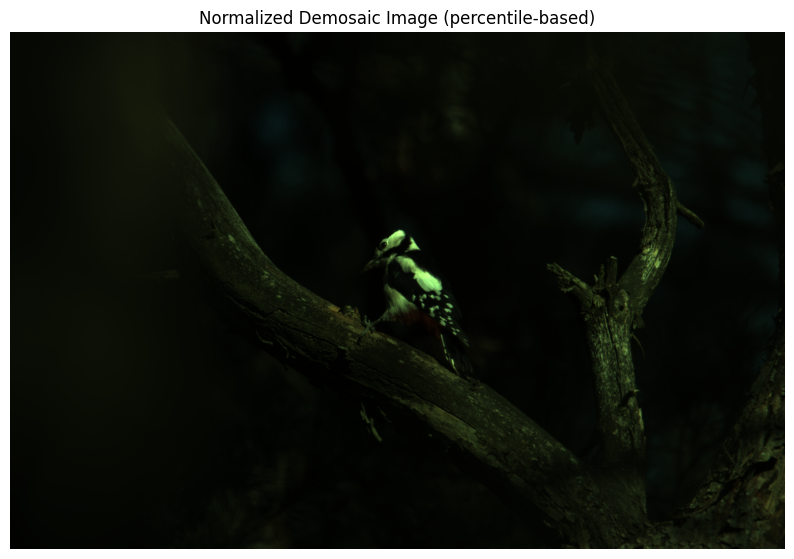

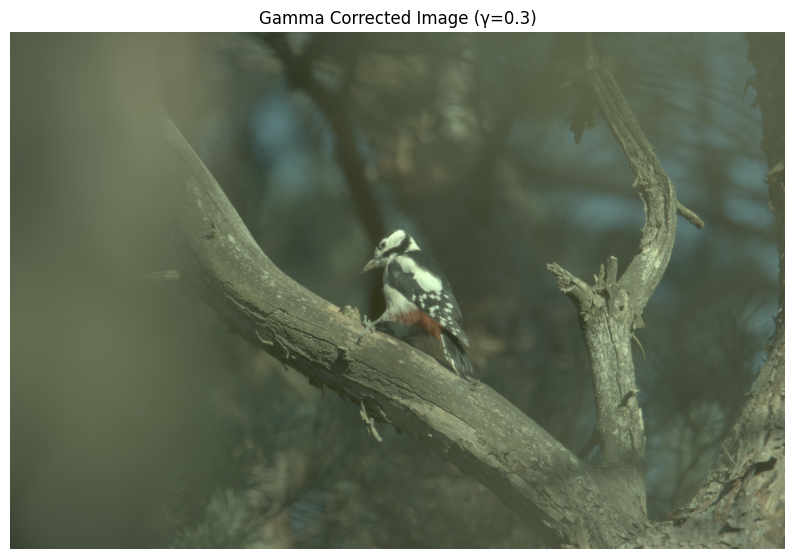

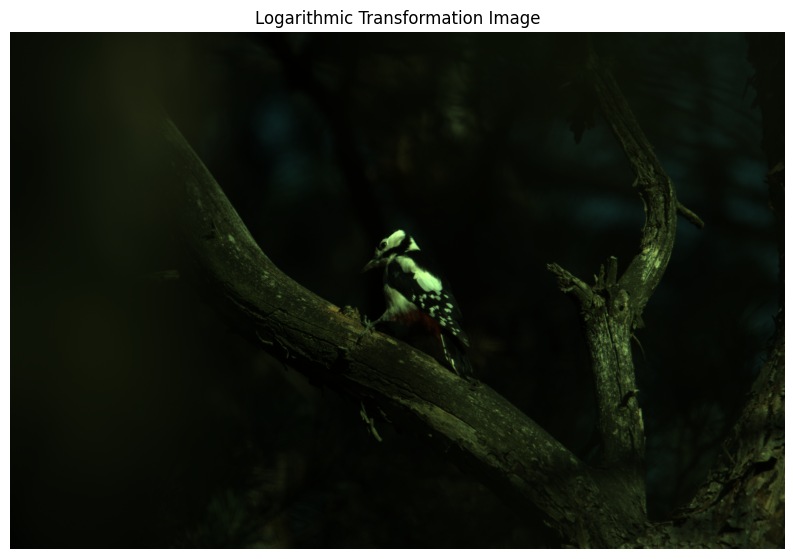

In [69]:
# Visualize the normalized image (using percentile-based normalization)
rgb_image_normalized, _, _ = normalize_with_percentiles(rgb_image)
visualize_image(rgb_image_normalized, "Normalized Demosaic Image (percentile-based)")

# Visualize the Gamma corrected image (γ = 0.3)
visualize_image(gamma_corrected_image, "Gamma Corrected Image (γ=0.3)")
# Save the gamma corrected image to file
save_image(gamma_corrected_image, 'Gamma Corrected Image.jpg')

# Visualize the logarithmic transformation image
visualize_image(log_transformed_image, "Logarithmic Transformation Image")
# Save the logarithmic transformation image to file
save_image(log_transformed_image, 'Logarithmic Transformation Image.jpg')

# 4. White Balance

In [22]:
def apply_gray_world_white_balance(image):
    # First checking weather the image is in floating point format for processing
    if image.dtype != np.float32 and image.dtype != np.float64:
        image = image.astype(np.float32) / 255.0
    
    # Calculate the mean of each channel
    mean_r = np.mean(image[:, :, 0])
    mean_g = np.mean(image[:, :, 1])
    mean_b = np.mean(image[:, :, 2])

    # Calculate the global mean
    mean_global = (mean_r + mean_g + mean_b) / 3

    # Scale each channel to make the mean of each channel equal to the global mean
    image[:, :, 0] *= (mean_global / mean_r)
    image[:, :, 1] *= (mean_global / mean_g)
    image[:, :, 2] *= (mean_global / mean_b)

    # Clip the values to [0, 1] and convert back to original data type if necessary
    np.clip(image, 0, 1, out=image)

    if image.dtype == np.float32:
        return (image * 255).astype(np.uint8)
    return image

In [23]:
grey_world_image = apply_gray_world_white_balance(rgb_image_normalized)

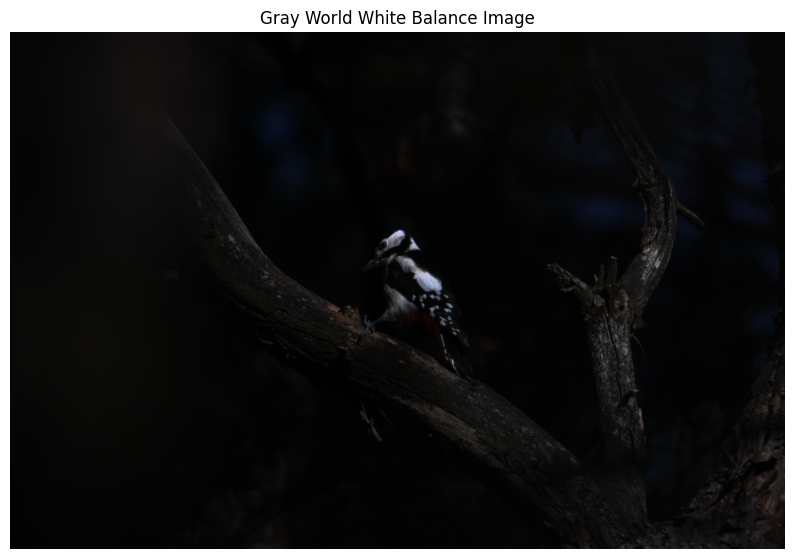

In [24]:
visualize_image(grey_world_image, "Gray World White Balance Image")
save_image(grey_world_image, "Gray World White Balance.jpg ")

# 5. Show that Sensor Data is Linear

In [25]:
raw = rawpy.imread('exercise_2_data/05/IMG_3044.CR3')
raw_array = np.array(raw.raw_image_visible)

- Define the paths to the CR3 files and corresponding exposure times


In [26]:
file_paths = [
    'exercise_2_data/05/IMG_3044.CR3',
    'exercise_2_data/05/IMG_3045.CR3',
    'exercise_2_data/05/IMG_3046.CR3',
    'exercise_2_data/05/IMG_3047.CR3',
    'exercise_2_data/05/IMG_3048.CR3',
    'exercise_2_data/05/IMG_3049.CR3'
]
exposure_times = [1/10, 1/20, 1/40, 1/80, 1/160, 1/320]  

In [27]:
# Initialize lists to store average values for each color channel
avg_red = []
avg_green = []
avg_blue = []

# Load each file and calculate the average values of each color channel
for file_path in file_paths:
    with rawpy.imread(file_path) as raw:
        # Get the visible part of the raw image
        image_data = raw.raw_image_visible
        
        # Assuming RGGB Bayer pattern, we need to manually extract the colors
        red = image_data[0::2, 0::2]  # Red pixels
        green1 = image_data[0::2, 1::2]  # Green pixels on red rows
        green2 = image_data[1::2, 0::2]  # Green pixels on blue rows
        blue = image_data[1::2, 1::2]  # Blue pixels
        
        # Calculate the averages
        avg_red.append(np.mean(red))
        avg_green.append((np.mean(green1) + np.mean(green2)) / 2)
        avg_blue.append(np.mean(blue))

**Visualization**

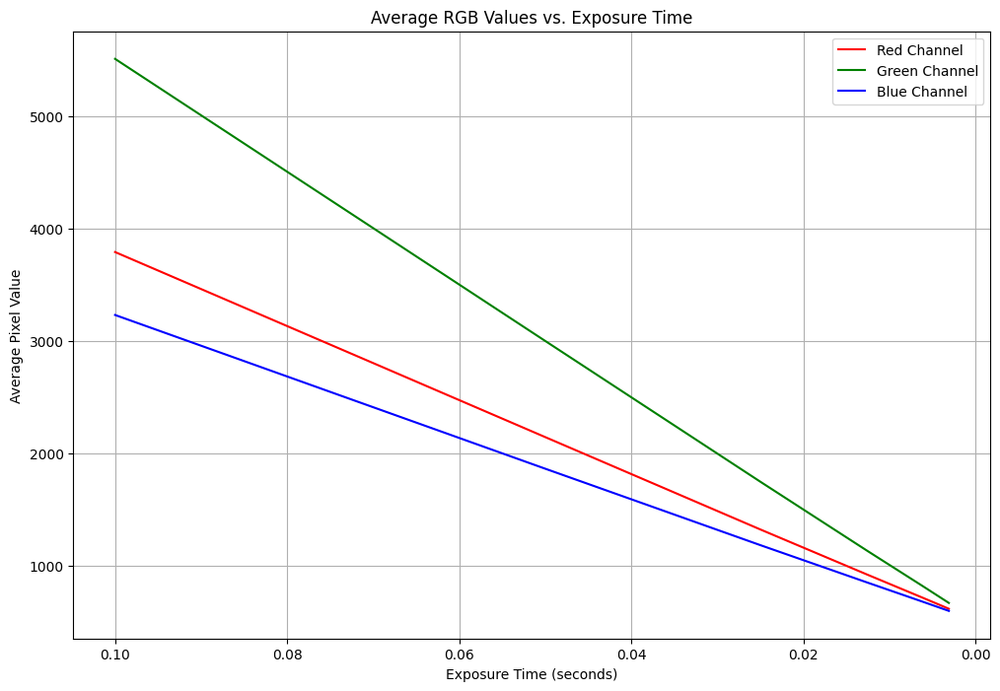

In [28]:
plt.figure(figsize=(12, 8))
plt.plot(exposure_times, avg_red, 'r-', label='Red Channel')
plt.plot(exposure_times, avg_green, 'g-', label='Green Channel')
plt.plot(exposure_times, avg_blue, 'b-', label='Blue Channel')
plt.gca().invert_xaxis()  # Invert the x-axis to show increasing exposure times from right to left
plt.xlabel('Exposure Time (seconds)')
plt.ylabel('Average Pixel Value')
plt.title('Average RGB Values vs. Exposure Time')
plt.legend()
plt.grid(True)
plt.show()

# 6. Initial HDR Implementation

- Firstly we define the function to View all the files from 00 to 10 

In [29]:
def load_and_visualize_images(file_paths):
    plt.figure(figsize=(15, 10))
    
    # Iterate through each file path, load the image and add a subplot to display it
    for i, file_path in enumerate(file_paths):
        with rawpy.imread(file_path) as raw:
            rgb_image = raw.postprocess()
            ax = plt.subplot(3, 4, i + 1) 
            ax.imshow(rgb_image)
            ax.set_title(f'Image {i}')
            ax.axis('off')
            
    plt.tight_layout()
    plt.show()

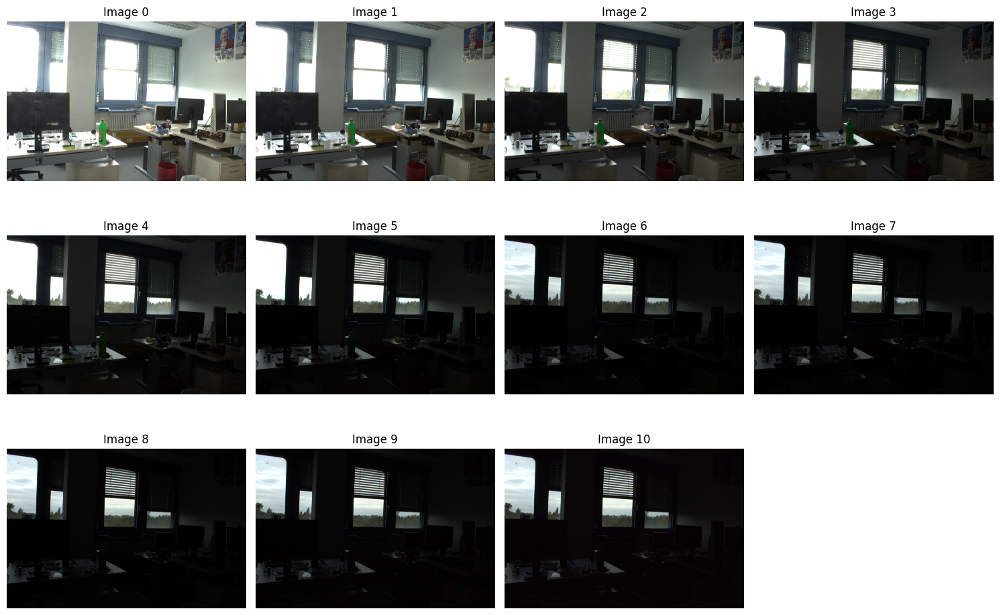

In [30]:
# Defining file paths and Calling function
file_paths = [
    'exercise_2_data/06/00.CR3', 'exercise_2_data/06/01.CR3', 'exercise_2_data/06/02.CR3',
    'exercise_2_data/06/03.CR3', 'exercise_2_data/06/04.CR3', 'exercise_2_data/06/05.CR3',
    'exercise_2_data/06/06.CR3', 'exercise_2_data/06/07.CR3', 'exercise_2_data/06/08.CR3',
    'exercise_2_data/06/09.CR3', 'exercise_2_data/06/10.CR3'
]
load_and_visualize_images(file_paths)

HDR Function

In [31]:
def load_images(file_paths):
    raw_images = []
    for path in file_paths:
        with rawpy.imread(path) as raw:
            raw_images.append(raw.postprocess())
    return raw_images

In [32]:
def simple_hdr_combination(raw_images):
    # Initialize HDR image with the first image
    hdr_image = raw_images[0].astype(float)
    
    # Normalize the first image for baseline
    hdr_image /= hdr_image.max()

    # Blend other images into the HDR process
    for i in range(1, len(raw_images)):
        img = raw_images[i].astype(float)
        img /= img.max() 

        # Calculate blending weights dynamically
        blend_factor = 1.0 / (i + 1)
        hdr_image = hdr_image * (1 - blend_factor) + img * blend_factor

    # Rescale to full 8-bit range (0-255)
    hdr_image -= hdr_image.min()
    hdr_image /= hdr_image.max()
    hdr_image *= 255
    return hdr_image.astype(np.uint8)

In [33]:
raw_images = load_images(file_paths)

In [35]:
hdr_image = simple_hdr_combination(raw_images)

Visualization

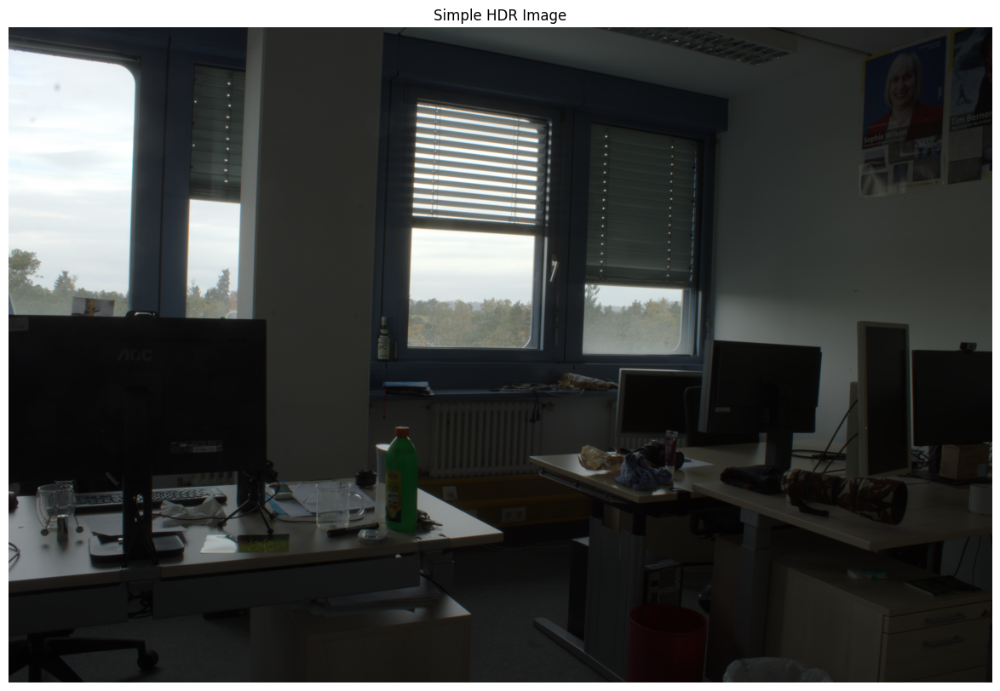

In [36]:
hdr_image_sav = Image.fromarray(hdr_image)
hdr_image_sav.save('Simple HDR.jpg', 'JPEG', dpi=(300, 300), quality=95) 
hdr_image_sav.show()

plt.figure(figsize=(30, 10))
plt.imshow(hdr_image)
plt.title('Simple HDR Image')
plt.axis('off')
plt.show()

Now we do Image Enhancement
- Defining Function for Gamma Correction, Contrast Enhancement and Percentile Normalization

In [37]:
def gamma_correction(image, gamma):
    image = image / 255.0
    image = np.power(image, gamma)
    return (image * 255).astype(np.uint8)


In [ ]:
!pip install opencv-python

In [43]:
import cv2

In [44]:

def contrast_enhancement(image):
    # Apply CLAHE to the LAB color space's L channel only
    lab_image = cv2.cvtColor(image, cv2.COLOR_RGB2Lab)
    l, a, b = cv2.split(lab_image)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    l = clahe.apply(l)
    enhanced_lab = cv2.merge((l, a, b))
    return cv2.cvtColor(enhanced_lab, cv2.COLOR_Lab2RGB)



In [45]:
def adjusted_percentile_normalization(image):
    # Normalize image using 1st and 99th percentiles to remove outliers
    lower = np.percentile(image, 1)
    upper = np.percentile(image, 99)
    image = np.clip((image - lower) / (upper - lower), 0, 1)
    return (image * 255).astype(np.uint8)

In [46]:
adj_hdr_image = adjusted_percentile_normalization(hdr_image)


In [47]:
gama_hdr_image = gamma_correction(adj_hdr_image, gamma=0.8) 


In [48]:
cont_hdr_image = contrast_enhancement(gama_hdr_image)

Visualization and Saving Results

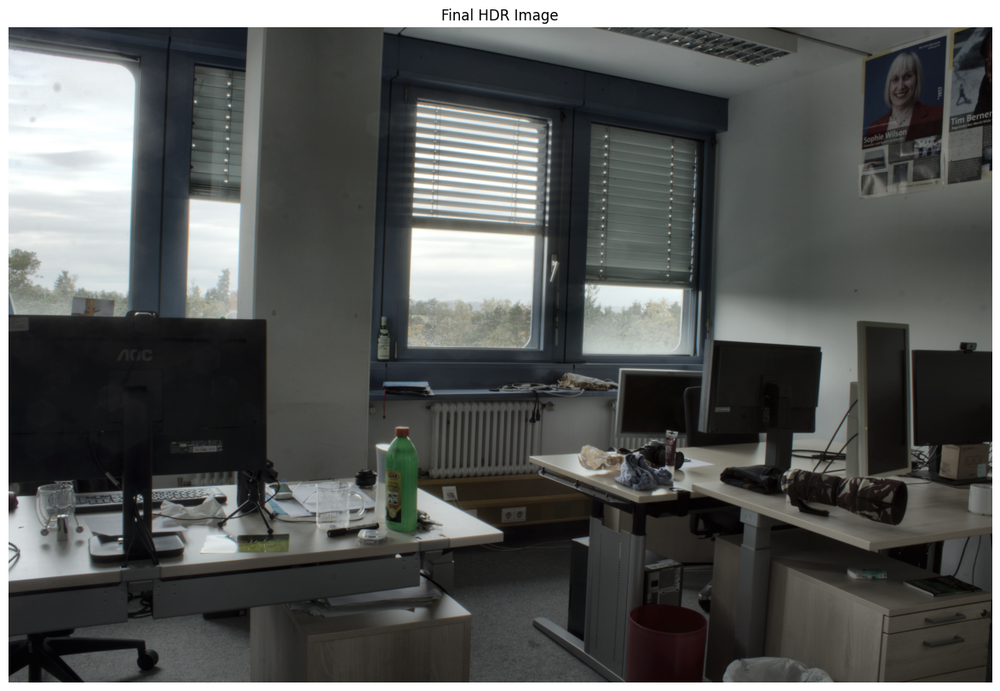

In [49]:
final_image = Image.fromarray(cont_hdr_image)
final_image.save('HDR_high_quality.jpg', 'JPEG', dpi=(300, 300), quality=95) 
final_image.show()

plt.figure(figsize=(30, 10))
plt.imshow(final_image)
plt.title('Final HDR Image')
plt.axis('off')
plt.show()

# 07. iCAM06

In [50]:
def icam06_tone_mapping(image, output_range=4, bilateral_d=5, bilateral_sigmaColor=0.1, bilateral_sigmaSpace=5):
    # Calculate weighted intensity for luminance
    input_intensity = (20 * image[:, :, 0] + 40 * image[:, :, 1] + image[:, :, 2]) / 61
    input_intensity = np.maximum(input_intensity, 1e-6)  # Avoid divide by zero

    # Normalize RGB by intensity
    b, g, r = image[:, :, 0] / input_intensity, image[:, :, 1] / input_intensity, image[:, :, 2] / input_intensity
    print("R Channel Stats - Min: {}, Max: {}, NaN: {}, Inf: {}".format(np.min(r), np.max(r), np.isnan(r).any(), np.isinf(r).any()))
    print("G Channel Stats - Min: {}, Max: {}, NaN: {}, Inf: {}".format(np.min(g), np.max(g), np.isnan(g).any(), np.isinf(g).any()))
    print("B Channel Stats - Min: {}, Max: {}, NaN: {}, Inf: {}".format(np.min(b), np.max(b), np.isnan(b).any(), np.isinf(b).any()))
    
    # Compute log of the intensity
    log_input_intensity = np.log(input_intensity)
    log_input_intensity = log_input_intensity.astype(np.float32)

    # Apply bilateral filter to the log intensity
    log_base = cv2.bilateralFilter(log_input_intensity, d=bilateral_d, sigmaColor=bilateral_sigmaColor, sigmaSpace=bilateral_sigmaSpace)

    # Detail extraction
    log_detail = log_input_intensity - log_base

    # Compression factor calculation
    log_range = np.log(output_range)
    compression = log_range / (np.max(log_base) - np.min(log_base))
    log_offset = -np.max(log_base) * compression
    
    print("Log Base Shape:", log_base.shape)
    print("Log Base Max Value:", np.max(log_base))
    print("Log Base Min Value:", np.min(log_base))
    print("Compression:", compression)
    print("Log Offset:", log_offset)

    # Calculate output intensity
    output_intensity = np.exp(log_base * compression + log_offset + log_detail)
    min_output_intensity = np.min(output_intensity)
    scaled_output_intensity = (output_intensity - min_output_intensity) / (np.max(output_intensity) - min_output_intensity)
    print("Output Intensity Max Value:", np.max(output_intensity))
    print("Output Intensity Min Value:", np.min(output_intensity))
    print("R Channel Max Value:", np.max(r))
    print("G Channel Max Value:", np.max(g))
    print("B Channel Max Value:", np.max(b))

    # Recombine channels with new intensity
    output_image = np.stack([r * scaled_output_intensity, g * scaled_output_intensity, b * scaled_output_intensity], axis=-1)
    print("R * Output Intensity Max Value:", np.max(r * output_intensity))
    print("G * Output Intensity Max Value:", np.max(g * output_intensity))
    print("B * Output Intensity Max Value:", np.max(b * output_intensity))

    # Clip to [0, 1] and convert to 8-bit
    output_image = np.clip(output_image * 255, 0, 255).astype(np.uint8)

    return output_image

Applying iCAM06 Functin

In [51]:
if hdr_image.dtype != np.float32:
    hdr_image_con = hdr_image.astype(np.float32) / 255
tone_mapped_image = icam06_tone_mapping(hdr_image_con)

R Channel Stats - Min: 0.012975961901247501, Max: 6.684931755065918, NaN: False, Inf: False
G Channel Stats - Min: 0.0, Max: 1.4982454776763916, NaN: False, Inf: False
B Channel Stats - Min: 0.0, Max: 3.0310559272766113, NaN: False, Inf: False
Log Base Shape: (4660, 6984)
Log Base Max Value: 0.0
Log Base Min Value: -4.839995
Compression: 0.2864247561513586
Log Offset: -0.0
Output Intensity Max Value: 1.0112021419725206
Output Intensity Min Value: 0.2306120626467434
R Channel Max Value: 6.6849318
G Channel Max Value: 1.4982455
B Channel Max Value: 3.031056
R * Output Intensity Max Value: 2.1005359610018854
G * Output Intensity Max Value: 1.070582369678377
B * Output Intensity Max Value: 1.81028143703427


Visualization & Saving

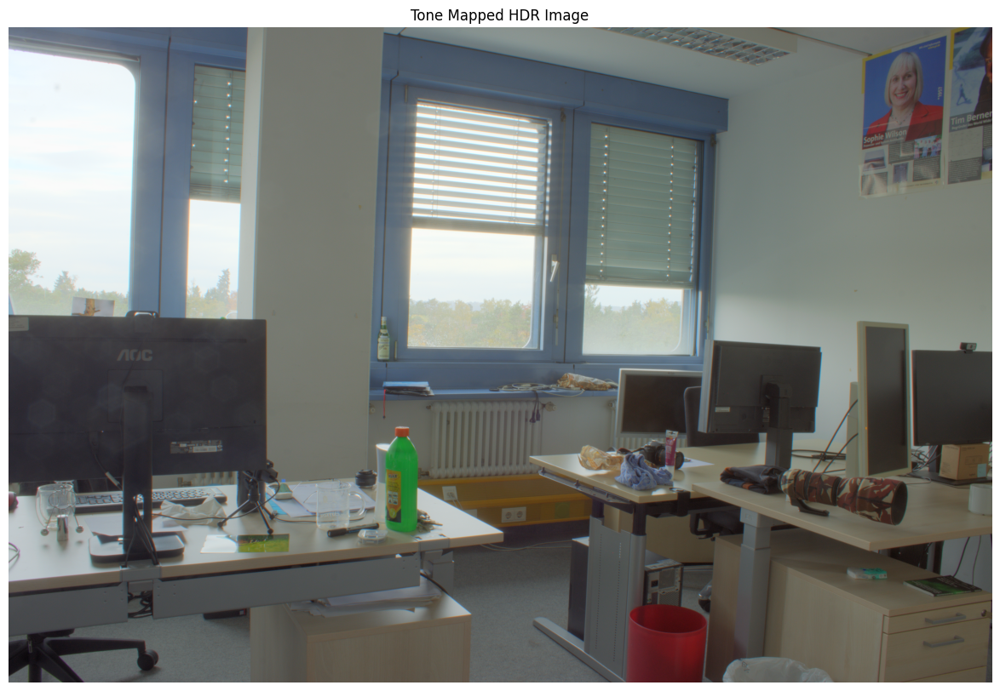

True

In [52]:
plt.figure(figsize=(30, 10))
plt.imshow(tone_mapped_image)  # No need to convert, as tone_mapped_image is already in RGB
plt.imshow(cv2.cvtColor(tone_mapped_image, cv2.COLOR_BGR2RGB))
plt.title('Tone Mapped HDR Image')
plt.axis('off')
plt.show()


output_image_bgr = cv2.cvtColor(tone_mapped_image, cv2.COLOR_RGB2BGR)
cv2.imwrite('tone_mapped_image.jpg', output_image_bgr)


Defining Filters, Sharpening and Denoising the Image

In [53]:
def bilateral_filter(image, d=9, sigma_color=75, sigma_space=75):
    filtered_image = cv2.bilateralFilter(image, d, sigma_color, sigma_space)
    return filtered_image



In [54]:
def guided_filter(image, guide, radius=9, eps=0.2):
    filtered_image = cv2.ximgproc.guidedFilter(guide, image, radius, eps)
    return filtered_image



In [55]:
def apply_sharpening(image, alpha=1.5, beta=-0.5):
    blurred = cv2.GaussianBlur(image, (0, 0), 3)
    sharpened = cv2.addWeighted(image, alpha, blurred, beta, 0)
    return sharpened



In [56]:
def apply_denoising(image):
    denoised = cv2.fastNlMeansDenoisingColored(image, None, 10, 10, 7, 21)
    return denoised

In [57]:
bilateral_filtered_image = bilateral_filter(tone_mapped_image)
guided_filtered_image = guided_filter(bilateral_filtered_image, tone_mapped_image)
sharpened_image = apply_sharpening(guided_filtered_image)
denoised_image = apply_denoising(sharpened_image)

Visualization and Saving

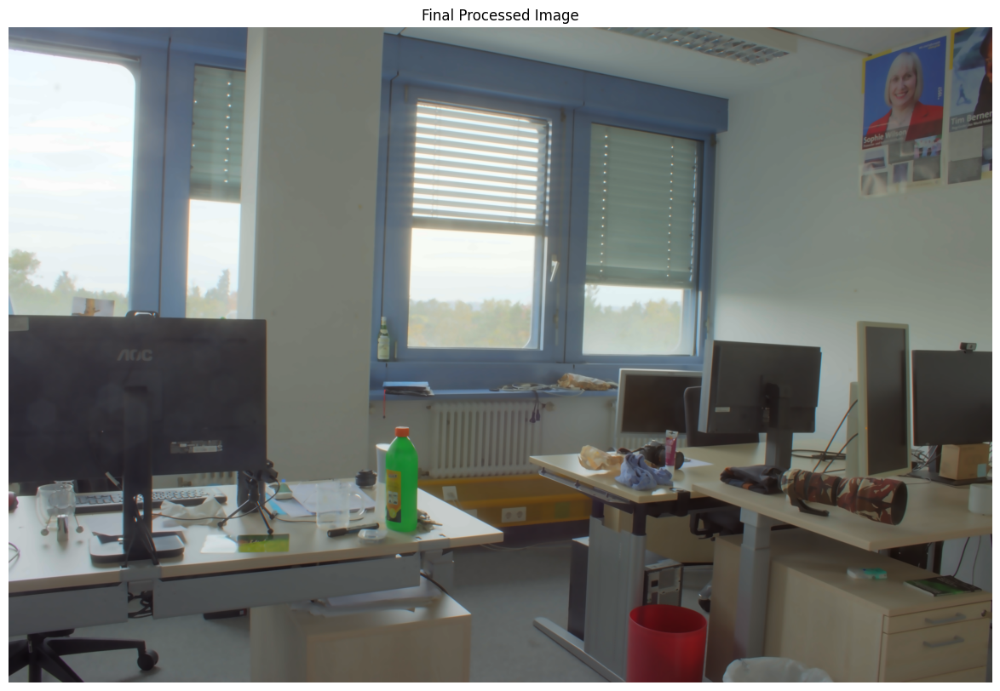

True

In [61]:
plt.figure(figsize=(30, 10))
plt.imshow(denoised_image)  # No need to convert, as tone_mapped_image is already in RGB
plt.imshow(cv2.cvtColor(denoised_image, cv2.COLOR_BGR2RGB))
plt.title('Final Processed Image')
plt.axis('off')
plt.show()


output_image_bgr = cv2.cvtColor(denoised_image, cv2.COLOR_RGB2BGR)
cv2.imwrite('Final_processed_image.jpg', output_image_bgr)

# 8. Win

Defining the Function name process Raw which takes in argument of raw file path and output path at which image will be saved

In [62]:
def process_raw(raw_file_path, output_path):
    # Load the raw CR3 file
    with rawpy.imread(raw_file_path) as raw:
        # Use rawpy to postprocess the raw data into an RGB image
        rgb = raw.postprocess(use_camera_wb=True, no_auto_bright=True, output_bps=16)

    # Convert to a format suitable for further processing with OpenCV
    image = np.array(rgb)
    image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)

    # Convert from 16-bit to 8-bit by scaling down
    image = (image / 256).astype(np.uint8)

    # Color correction to reduce the blue dominance
    lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab)
    b = b - 15  # Reduce the blue channel slightly
    lab = cv2.merge((l, a, b))
    image = cv2.cvtColor(lab, cv2.COLOR_LAB2BGR)

    # Detail enhancement using unsharp masking
    sharpen_kernel = np.array([[-1,-1,-1], [-1,9,-1], [-1,-1,-1]])
    image = cv2.filter2D(image, -1, sharpen_kernel)

    # Adjust denoising
    image = cv2.fastNlMeansDenoisingColored(image, None, 5, 5, 7, 21)  # Reduced strength to preserve details

    # Saturation correction (optional)
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    h, s, v = cv2.split(hsv)
    s = cv2.add(s, 10)  # Mild increase in saturation
    hsv = cv2.merge((h, s, v))
    image = cv2.cvtColor(hsv, cv2.COLOR_HSV2BGR)

    # Save the processed image
    imageio.imwrite(output_path, image, quality=99, dpi=(300, 300), format='JPEG')

    print(f"Processed image saved to {output_path}")
    plt.figure(figsize=(30, 10))
    plt.imshow(image)
    plt.axis('off')
    plt.show()

Processed image saved to output2.jpg


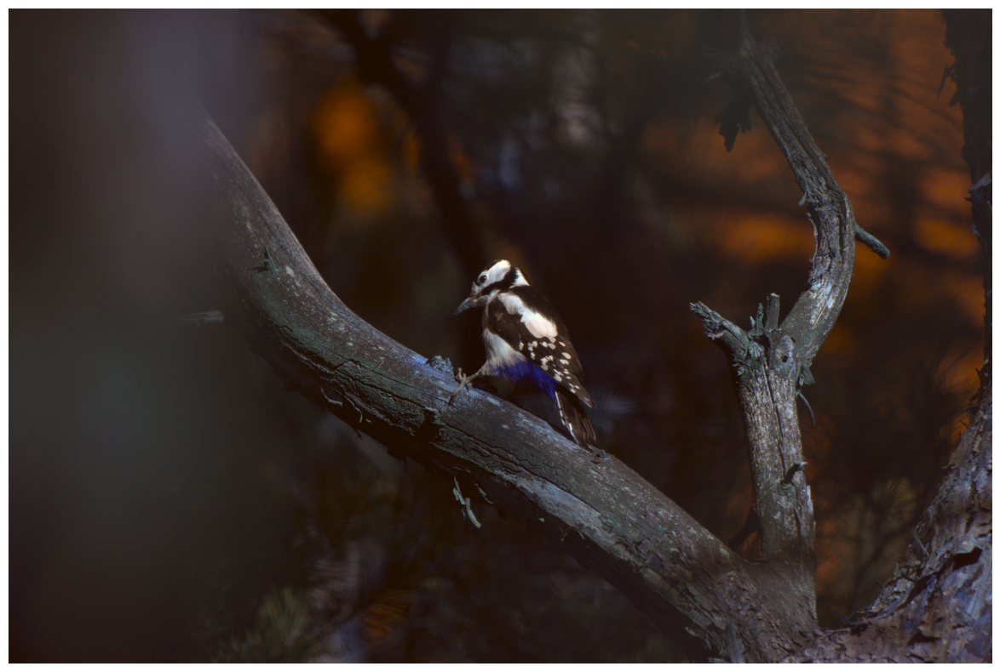

In [63]:
process_raw('exercise_2_data/02/IMG_4782.CR3', 'output2.jpg')